In [1]:
%%capture
import warnings
warnings.filterwarnings('ignore')

import os
os.environ["CALITP_BQ_MAX_BYTES"] = str(800_000_000_000)
import shared_utils

from calitp_data_analysis.tables import tbls
import calitp_data_analysis.magics

from siuba import *
import pandas as pd
import geopandas as gpd

import datetime as dt

import importlib
from rt_analysis import rt_filter_map_plot
# import build_speedmaps_index

from IPython.display import display, Markdown, Latex, HTML
import json

In [12]:
## parameters cell
itp_id = 4

In [13]:
analysis_date = dt.date(2023, 4, 12)

In [14]:
%%capture_parameters
human_date = analysis_date.strftime('%B %d %Y (%A)')
human_date

{"human_date": "April 12 2023 (Wednesday)"}


In [15]:
%%capture
rt_day = rt_filter_map_plot.from_gcs(itp_id, analysis_date)

In [16]:
%%capture_parameters
organization_name = rt_day.organization_name
organization_name

{"organization_name": "Alameda-Contra Costa Transit District"}


# {organization_name}

## About These Maps:

* Each map shows bus (and rail, if applicable) speeds for {organization_name}, with a map each for the morning peak, midday, and afternoon peak periods on {human_date}.
* On the map, routes are split into segments corresponding to the distance between two stops, allowing you to focus on specific portions of the route experiencing a slowdown.
* Route segments are arrow-shaped to indicate direction of travel. Thicker segments indicate more frequent transit routes.
* State Highway Network routes are outlined in gray.
* Hover over, or click, a segment with your mouse to see the exact speed, route name, and transit service frequency in that segment. 
    * Higher-frequency routes (3+ trips per hour) are especially important, since those slowdowns correspond to more vehicles, and riders, delayed in traffic.

## Morning Peak (ish)

In [17]:
%%capture
rt_day.set_filter(start_time='06:00', end_time='09:10')

In [18]:
## avoid papermill errors when map fails to render
m = None

In [19]:
%%capture
m = rt_day.segment_speed_map(how='low_speeds', no_title=True, shn=True)

In [20]:
m

In [11]:
shared_utils.rt_utils.arrowize_segment?

Signature:
shared_utils.rt_utils.arrowize_segment(
    line_geometry,
    buffer_distance: int = 20,
)
Docstring:
Given a linestring segment from a gtfs shape,
buffer and clip to show direction of progression
File:      ~/data-analyses/_shared_utils/shared_utils/rt_utils.py
Type:      function

In [14]:
line = (rt_day.stop_segment_speed_view
       >> filter(_.shape_id == '26160', _.stop_sequence == 5)
       ).geometry.iloc[0]

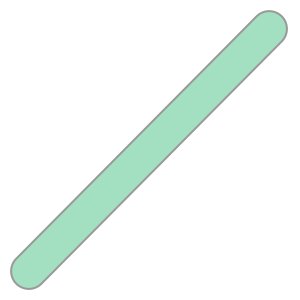

In [15]:
shared_utils.rt_utils.arrowize_segment(line)

In [22]:
import shapely

In [44]:
def arrowize_segment(line_geometry, buffer_distance: int = 20):
    """Given a linestring segment from a gtfs shape,
    buffer and clip to show direction of progression"""
    global r_shift, r_pt, r_pt2, l_shift, l_pt, l_pt2
    global end, end_2, segment_clip_mask, t1, t2, poly
    arrow_distance = buffer_distance  # was buffer_distance * 0.75
    st_end_distance = arrow_distance + 3  # avoid floating point errors...
    # try:
    
    segment = line_geometry.simplify(tolerance=5)
    if segment.length < 50:  # return short segments unmodified, for now
        return segment.buffer(buffer_distance)
    arrow_distance = max(arrow_distance, line_geometry.length / 20)
    shift_distance = buffer_distance + 1

    begin_segment = shapely.ops.substring(segment, 0, st_end_distance)
    r_shift = begin_segment.parallel_offset(shift_distance, "right")
    r_pt = shapely.ops.substring(r_shift, 0, 0)
    l_shift = begin_segment.parallel_offset(shift_distance, "left")
    l_pt = shapely.ops.substring(l_shift, 0, 0)
    end = shapely.ops.substring(
        begin_segment,
        begin_segment.length + arrow_distance,
        begin_segment.length + arrow_distance,
    )
    poly = shapely.geometry.Polygon((r_pt, end, l_pt))  # triangle to cut bottom of arrow
    # ends to the left
    end_segment = shapely.ops.substring(segment, segment.length - st_end_distance, segment.length)
    end_2 = shapely.ops.substring(end_segment, end_segment.length, end_segment.length)  # correct
    r_shift = end_segment.parallel_offset(shift_distance, "right")
    r_pt = shapely.ops.substring(r_shift, 0, 0)
    r_pt2 = shapely.ops.substring(r_shift, r_shift.length - arrow_distance, r_shift.length - arrow_distance)
    l_shift = end_segment.parallel_offset(shift_distance, "left")
    l_pt = shapely.ops.substring(l_shift, 0, 0)
    l_pt2 = shapely.ops.substring(l_shift, arrow_distance, arrow_distance)
    t1 = shapely.geometry.Polygon((l_pt2, end_2, l_pt))  # triangles to cut top of arrow
    t2 = shapely.geometry.Polygon((r_pt2, end_2, r_pt))

    segment_clip_mask = shapely.geometry.MultiPolygon((poly, t1, t2))

    # buffer, then clip segment with arrow shape
    differences = segment.buffer(buffer_distance).difference(segment_clip_mask)
    # # of resulting geometries, pick largest (actual segment, not any scraps...)
    areas = [x.area for x in differences.geoms]
    for geom in differences.geoms:
        if geom.area == max(areas):
            return geom
    # except Exception as e:
    #     print(e)
    #     return line_geometry.simplify(tolerance=5).buffer(buffer_distance)

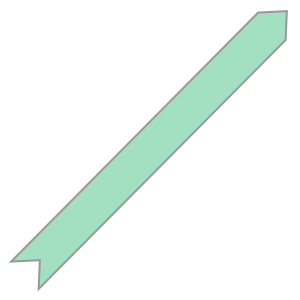

In [45]:
arrowize_segment(line)